# Computer Vision - Tutorial 3

In this practical session, we will use the `opencv` library to perform thresholding, filtering, mathematical morphology and image segmentation.

In [218]:
%matplotlib inline

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from ipywidgets import interact

plt.rcParams['figure.figsize'] = [12, 8]

from matplotlib.colors import LinearSegmentedColormap

def getRandomColorMap(num_colors, bg_color=1):
    colors = np.random.rand(num_colors, 3) * 0.75
    colors[0, :] = bg_color
    colors = tuple(map(tuple, colors))

    labelColorMap = LinearSegmentedColormap.from_list('labelColorMap', colors, N=num_colors)

    return labelColorMap

def multiplot(lines, columns, images, cmap, title):
    plt.figure(figsize=(20,10))
    for i in np.arange(lines*columns):
        
        plt.subplot(lines, columns, i+1)
        plt.imshow(images[i], cmap=cmap[i])
        plt.title(title[i])
        plt.xticks([])
        plt.yticks([])
        
    plt.show()
    
    
def double_plot(images, titles=["Original", "Altered"],cmaps=[]):
    assert(len(images)==2)
    if cmaps:
        assert(len(cmaps)==2)
    else:
        cmaps = [cm.gray]*2
    multiplot(lines=1,columns=2,images=images,cmap=cmaps, title=titles)


## 1. Thresholding

#### Just showing an image

In [220]:
def getGrayImage(filename):
    return cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

RICE_IMG = getGrayImage("../Images/rice.jpg")
CAMERAMAN_IMG = getGrayImage("../Images/cameraman.jpg")
PATTERN_IMG = getGrayImage("../Images/Pattern_inspection2.png")


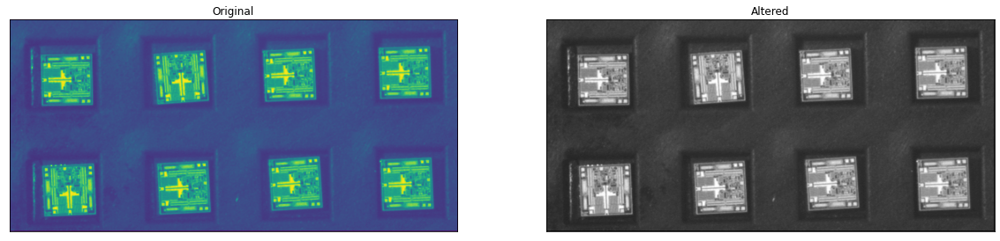

In [222]:
double_plot([PATTERN_IMG, PATTERN_IMG], cmaps=[None, cm.gray])

#### Compute and display the histogram of a grayscale image



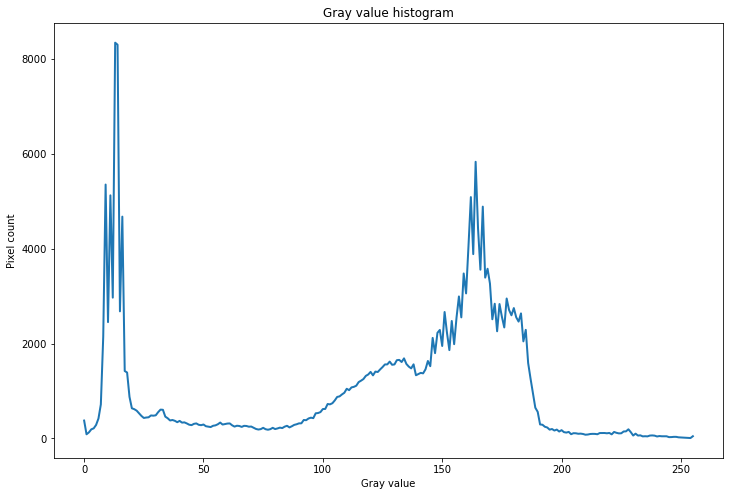

In [224]:
def plot_hist(img, ylim=None):
    
    plt.figure()
    hist = cv2.calcHist([img],[0],None,[256],[0,256])
    hist = hist.astype(int)
    plt.plot(
       hist.ravel(),
        linewidth=2
    )
    
    plt.title("Gray value histogram")
    plt.xlabel("Gray value")
    plt.ylabel("Pixel count")
    if ylim:
        plt.ylim(ylim)

plot_hist(CAMERAMAN_IMG)

#### Basic thresholding with python

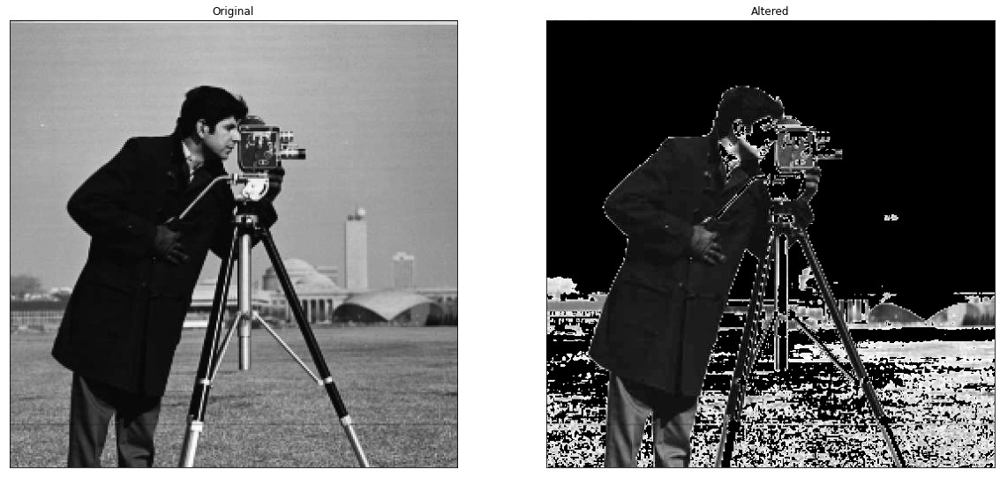

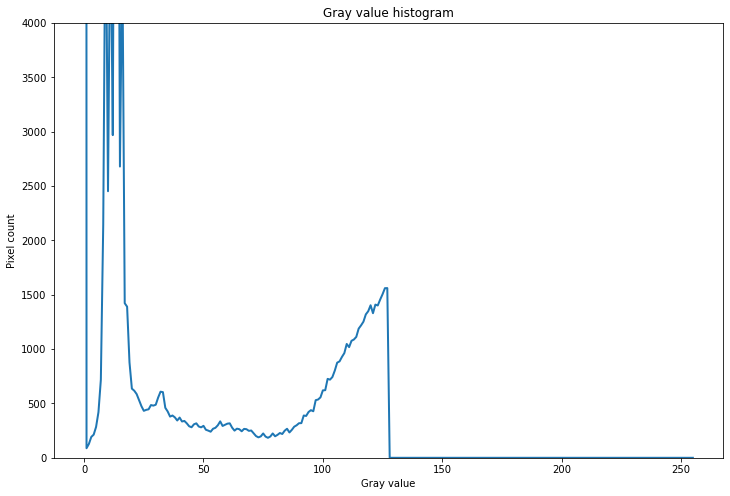

In [226]:
threshold = 128

img_gray_threshold = CAMERAMAN_IMG.copy()
img_gray_threshold[img_gray_threshold >= threshold] = 0

double_plot([CAMERAMAN_IMG, img_gray_threshold])
plot_hist(img_gray_threshold, ylim=[0,4000])

#### Thresholding with OpenCV
Determine the v1 and v2 values for the following threshold types:  
cv.THRESH_BINARY
$$\text{th_image}(x,y)=\left\{
                \begin{array}{ll}
                  \texttt{maxval} & \text{if img$(x,y)$ > thresh}\\
                  \texttt{0} & \text{otherwise}
                \end{array}
              \right.
$$

cv.THRESH_BINARY_INV
$$\text{th_image}(x,y)=\left\{
                \begin{array}{ll}
                  \texttt{0} & \text{if img$(x,y)$ > thresh}\\
                  \texttt{maxval} & \text{otherwise}
                \end{array}
              \right.
$$

cv.THRESH_TRUNC
$$\text{th_image}(x,y)=\left\{
                \begin{array}{ll}
                  \texttt{threshold} & \text{if img$(x,y)$ > thresh}\\
                  \texttt{img$(x,y)$} & \text{otherwise}
                \end{array}
              \right.
$$

cv.THRESH_TO_ZERO
$$\text{th_image}(x,y)=\left\{
                \begin{array}{ll}
                  \texttt{img$(x,y)$} & \text{if img$(x,y)$ > thresh}\\
                  \texttt{0} & \text{otherwise}
                \end{array}
              \right.
$$

cv.THRESH_TO_ZERO_INV
$$\text{th_image}(x,y)=\left\{
                \begin{array}{ll}
                  \texttt{0} & \text{if img$(x,y)$ > thresh}\\
                  \texttt{img$(x,y)$} & \text{otherwise}
                \end{array}
              \right.
$$

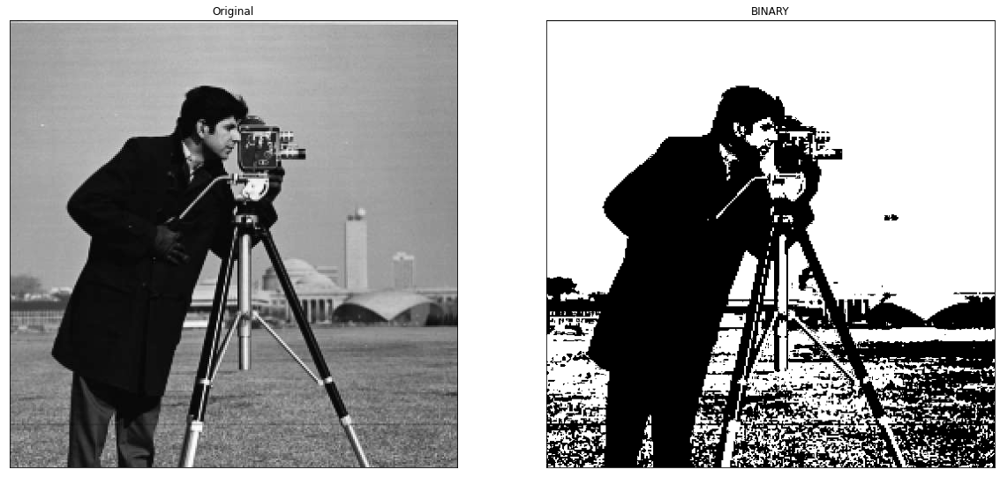

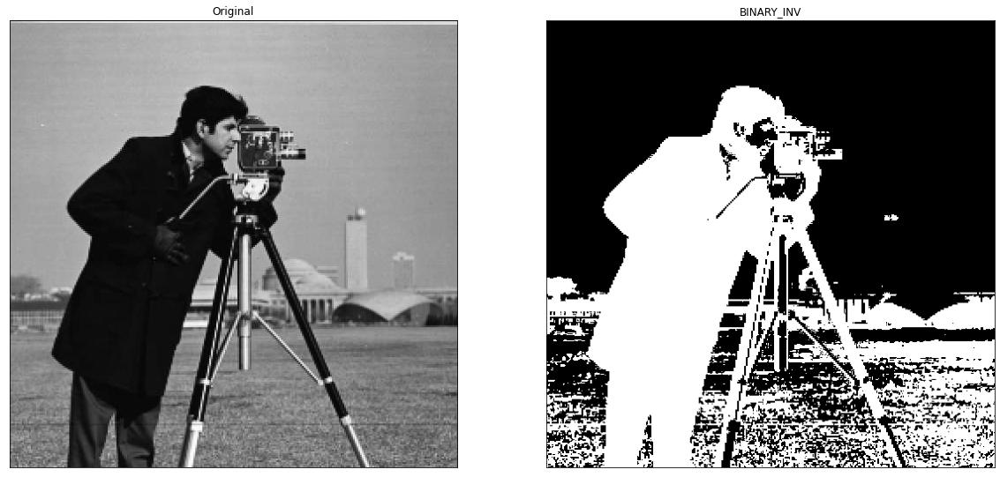

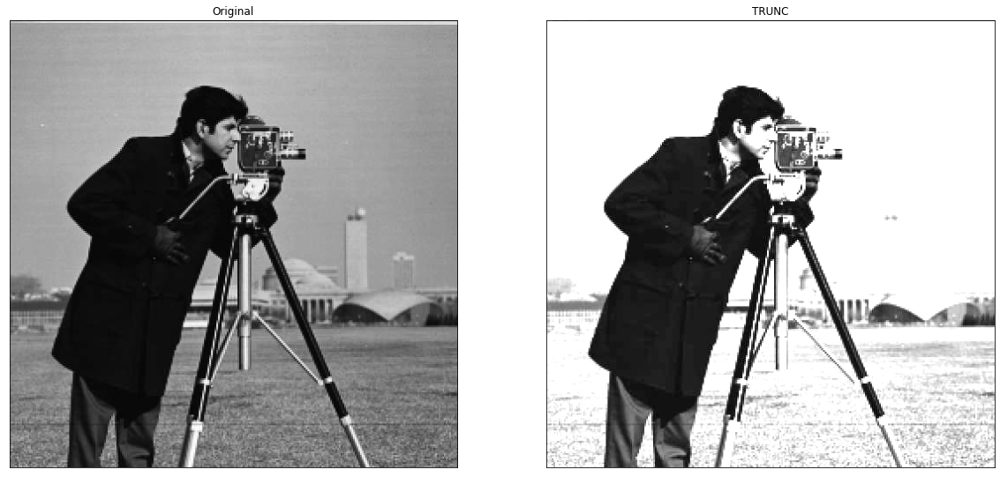

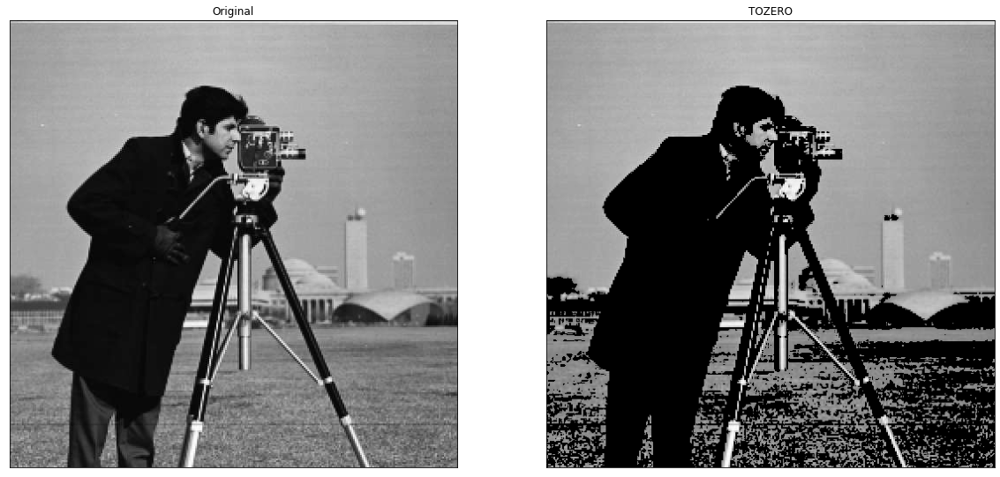

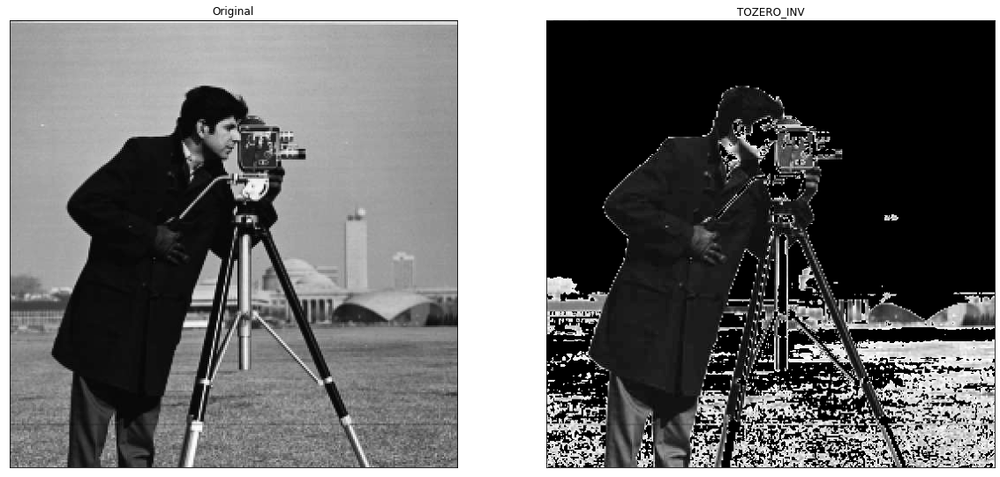

In [229]:

types = [
    cv2.THRESH_BINARY,
    cv2.THRESH_BINARY_INV,
    cv2.THRESH_TRUNC,
    cv2.THRESH_TOZERO,
    cv2.THRESH_TOZERO_INV
        ]
titles = ['BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']

for title, thresh_type in zip(titles, types):
    _,CAMERAMAN_IMG_THRESH = cv2.threshold(CAMERAMAN_IMG,127,255,thresh_type)

    double_plot([CAMERAMAN_IMG, CAMERAMAN_IMG_THRESH], titles=["Original", title])


#### Otsu's thresholding
In the previous examples, we had to chose the threshold value. We can use Otsu's algorithm to determine it.

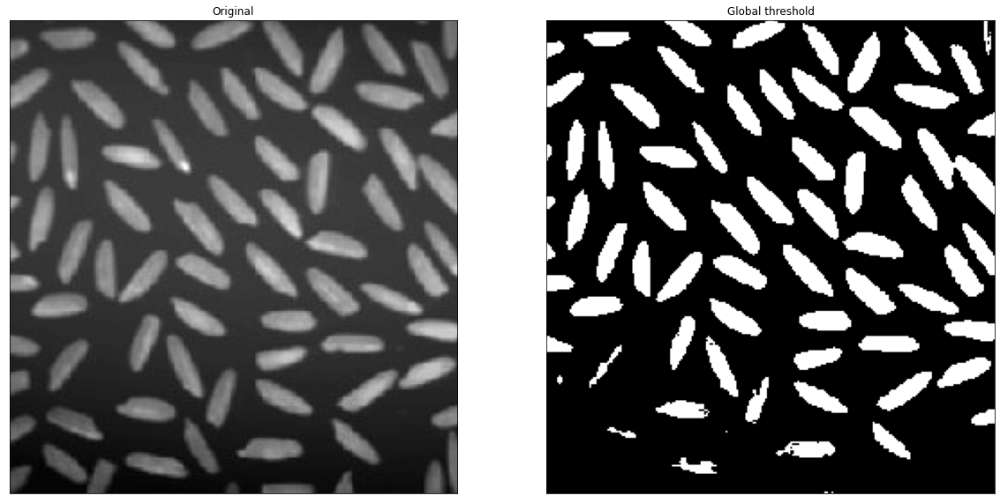

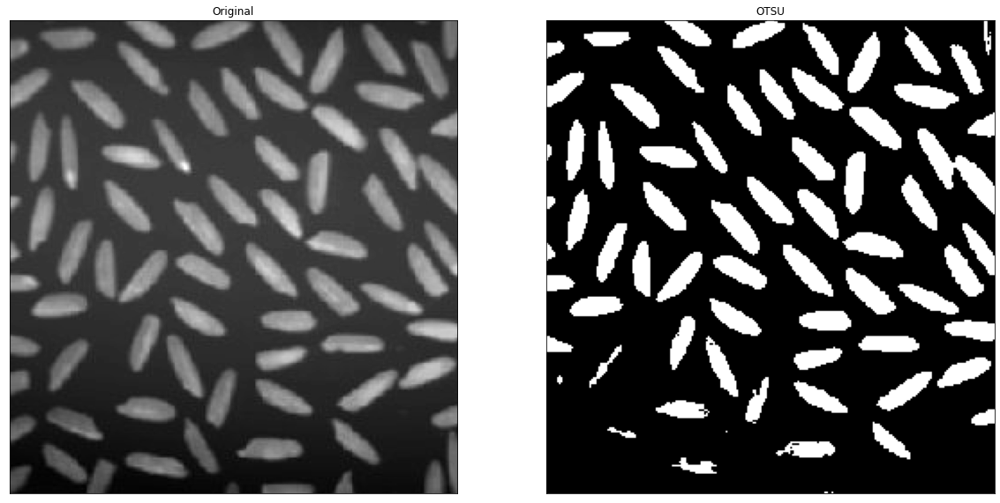

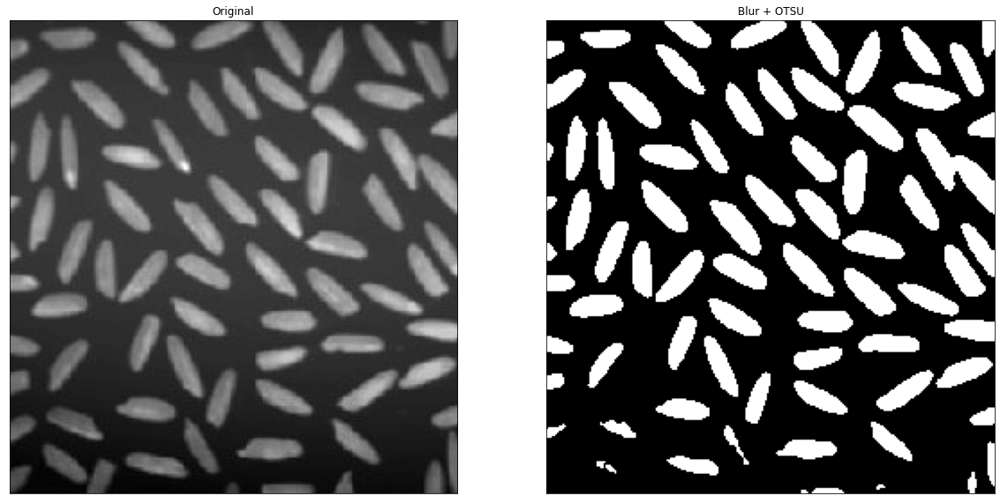

In [239]:
image = RICE_IMG
#Global threshold
_, global_threshold = cv2.threshold(image,127,255,cv2.THRESH_BINARY)
double_plot([image, global_threshold], titles=["Original", "Global threshold"])

#OTSU
_, otsu_threshold = cv2.threshold(image,255,255,cv2.THRESH_OTSU)
double_plot([image, global_threshold], titles=["Original", "OTSU"])

#Blurring + OTSU
blur = cv2.GaussianBlur(image,(5,5),0)
_, otsu_threshold_blur = cv2.threshold(blur,255,255,cv2.THRESH_OTSU)
double_plot([image, otsu_threshold_blur], titles=["Original", "Blur + OTSU"])


#### Otsu's algorithm by parts
You can fine-tune the result by applying this algorithm on the different parts of the image.

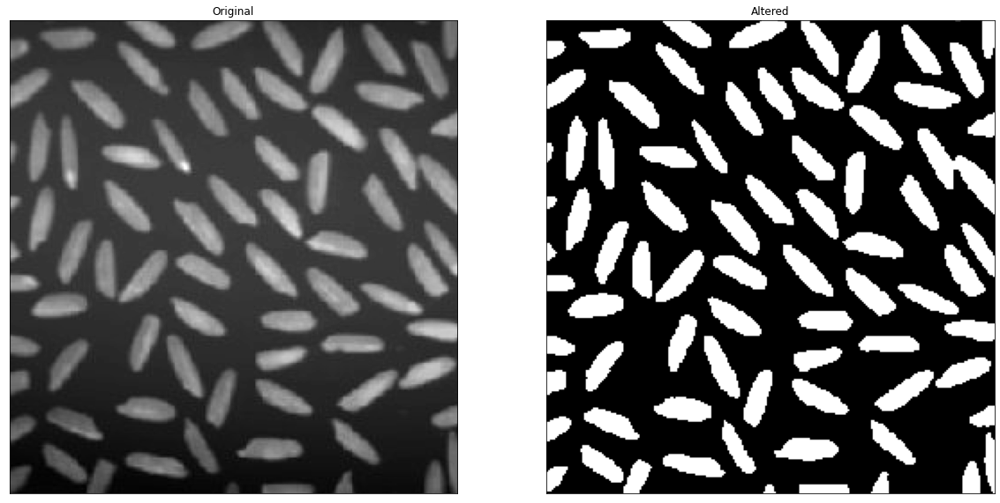

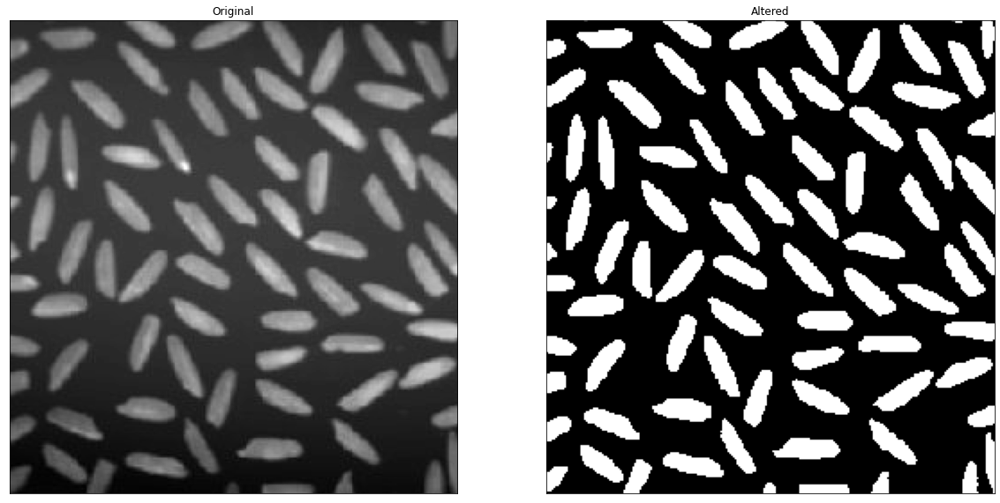

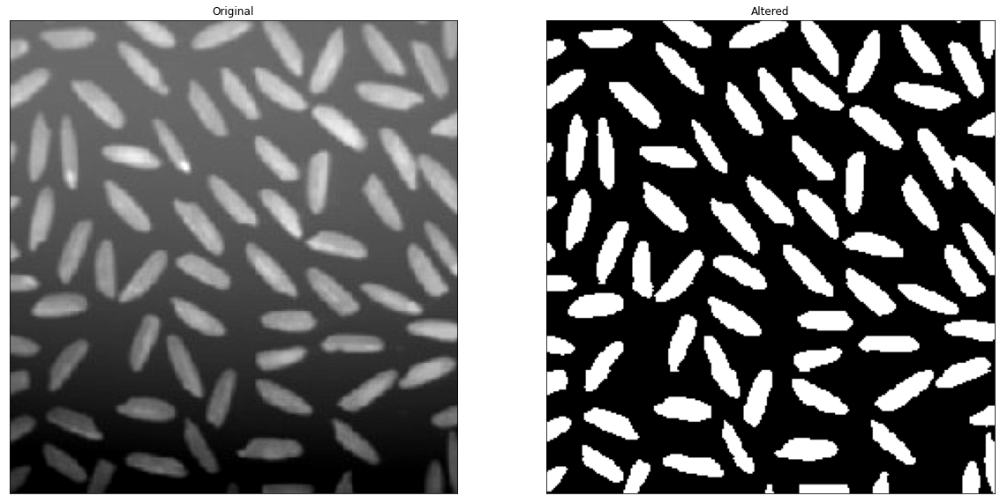

In [449]:
def get_parts(image, kernel=50):
    """ Split an image into `kernel`-sized squares, collected from
    top to bottom, left to right."""
    currentWidth = 0
    currentHeight = 0
    
    
    maxHeight = image.shape[0]
    maxWidth = image.shape[1]
    
    parts = []
    
    while currentHeight < maxHeight:
        nextHeight =  min(currentHeight + kernel, maxHeight)
        while currentWidth < maxWidth: 
            nextWidth =  min(currentWidth + kernel, maxWidth)
            part = image[
                currentHeight : nextHeight,
                currentWidth : nextWidth
            ]
            
            parts.append(part)
            currentWidth += kernel

        currentHeight += kernel
        currentWidth = 0

    return parts

def pop_N_from_start(myList, N):
    """ Pop the N first element from a list"""
    elements = []
    for i in range(N):
        elem = myList.pop(0)
        elements.append(np.asarray(elem, dtype=object))
    return elements

my_list = [1,2,3]
assert pop_N_from_start(my_list,2) == [1,2]
assert my_list == [3]
    
    
def get_image_from_parts(parts, maxHeight, maxWidth, kernel):
    """Recreate the image from parts generated from `get_parts()`"""
    import math
    nb_horizontal_parts = math.ceil(maxWidth / kernel)
    nb_vertical_parts = math.ceil(maxHeight / kernel)
    
    # Recombine each row by stacking parts horizontally
    rows = []
    for i in range(nb_vertical_parts):
        row_parts = pop_N_from_start(parts, nb_horizontal_parts)
        row = np.hstack(row_parts)
        rows.append(row)

    # Recombine the image by stacking rows vertically
    image = np.vstack(tuple(rows))
    return image

def otsu_on_part_lambda(part, threshold_type):
    return cv2.threshold(part,255,255, threshold_type +  cv2.THRESH_OTSU)[1]


def apply_OTSU_by_parts(image, kernel, threshold_type=cv2.THRESH_BINARY):
    parts = get_parts(image, kernel=kernel)
    otsu_parts = [otsu_on_part_lambda(part, threshold_type) for part in parts]
    
    return get_image_from_parts(
        otsu_parts, 
        maxHeight = image.shape[0], 
        maxWidth = image.shape[1], 
        kernel=kernel)

    
    
kernel = 49


# OTSU by parts
image_otsu_parts_threshold = apply_OTSU_by_parts(RICE_IMG, kernel)
double_plot([RICE_IMG, image_otsu_parts_threshold.astype(np.uint8)])


# Adaptive threshold
adaptive_thresh = cv2.adaptiveThreshold(RICE_IMG,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,kernel,-10)

double_plot([RICE_IMG, adaptive_thresh])


# OTSU by parts with non uniform lighting
light_gradient = np.arange(start=132, stop=-133, step=-1) / 3
non_uniform_lightning = (np.reshape(light_gradient, (265, 1))) * np.ones((1, 250), dtype=int)
non_uniform_rice = np.clip(RICE_IMG+non_uniform_lightning, 0, 255).astype(np.uint8)

otsu_parts_non_uniform = apply_OTSU_by_parts(non_uniform_rice, kernel)
double_plot([non_uniform_rice, otsu_parts_non_uniform.astype(np.uint8)])


## 2. Filtering

#### Gaussian noise

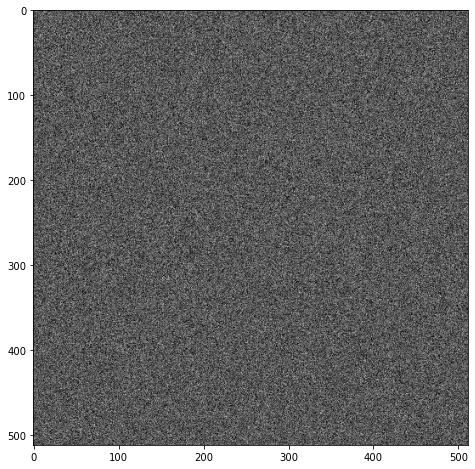

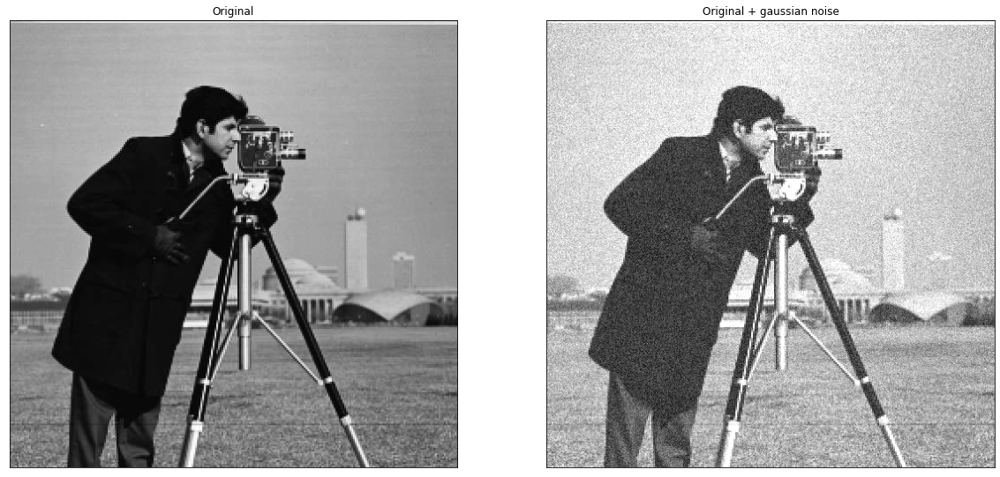

In [487]:
img = CAMERAMAN_IMG
zero_matrix = np.zeros_like(img)
gaussian_noise = cv2.randn(zero_matrix, 50, 20)

plt.imshow(gaussian_noise, cmap=cm.gray)
noisy_img = cv2.add(img,gaussian_noise)
double_plot([img, noisy_img], titles=['Original', 'Original + gaussian noise'])

#### Uniform, Gaussian and bilateral filtering

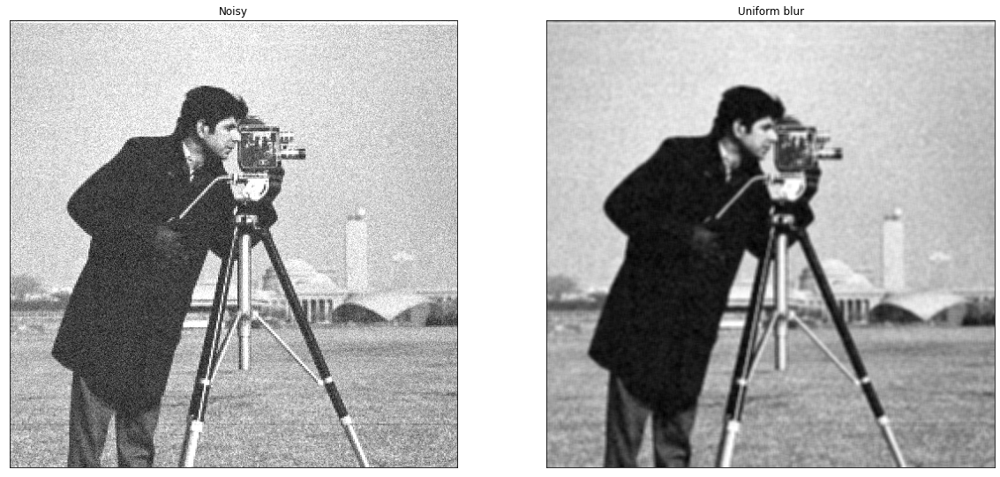

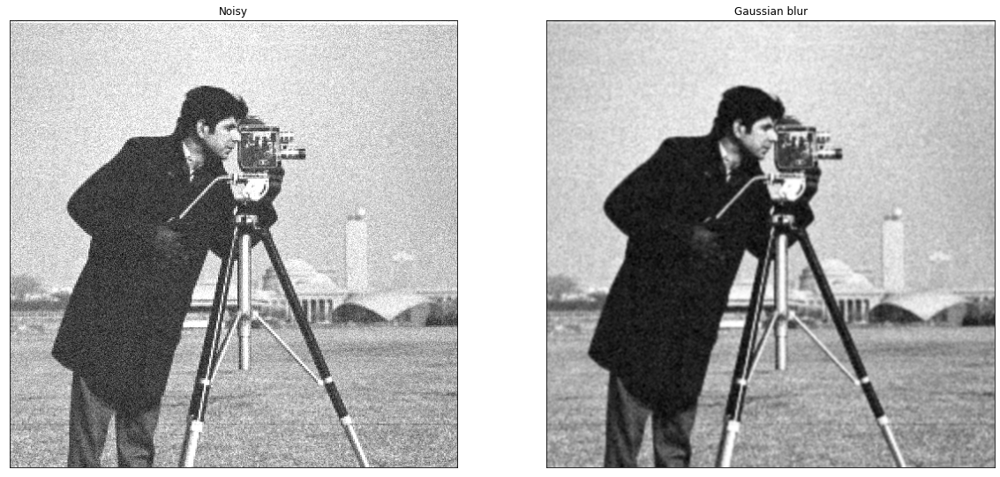

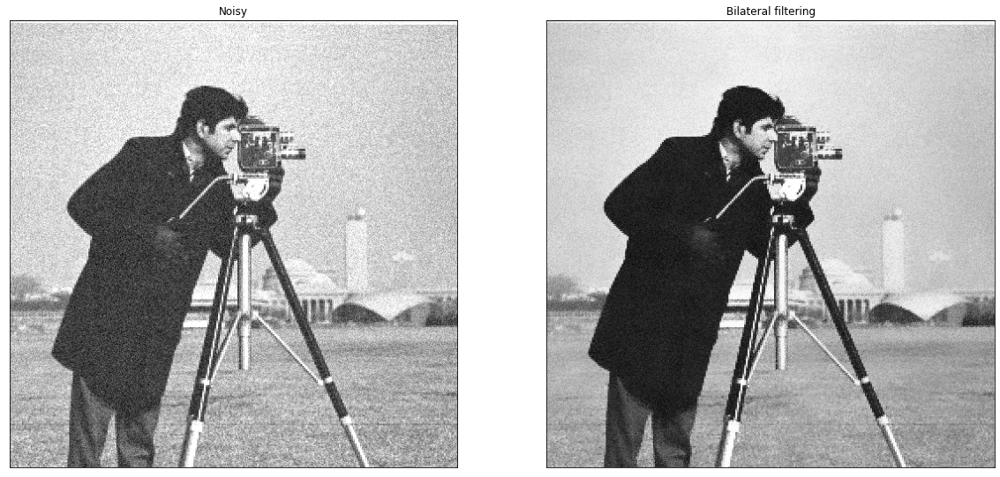

In [485]:
kernel = 5
noisy_uniform_blur = cv2.blur(noisy_img, (kernel, kernel))
noisy_gaussian_blur = cv2.GaussianBlur(noisy_img, (kernel, kernel), 0)
noisy_bilateral = cv2.bilateralFilter(noisy_img, -1, 25, 11)


double_plot([noisy_img, noisy_uniform_blur], titles=['Noisy', 'Uniform blur'])
double_plot([noisy_img, noisy_gaussian_blur], titles=['Noisy', 'Gaussian blur'])
double_plot([noisy_img, noisy_bilateral], titles=['Noisy', 'Bilateral filtering'])


#### Salt and pepper noise

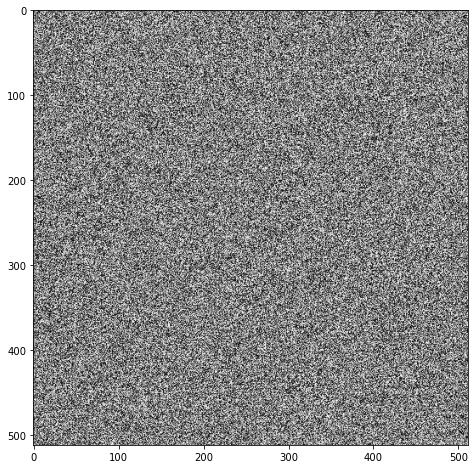

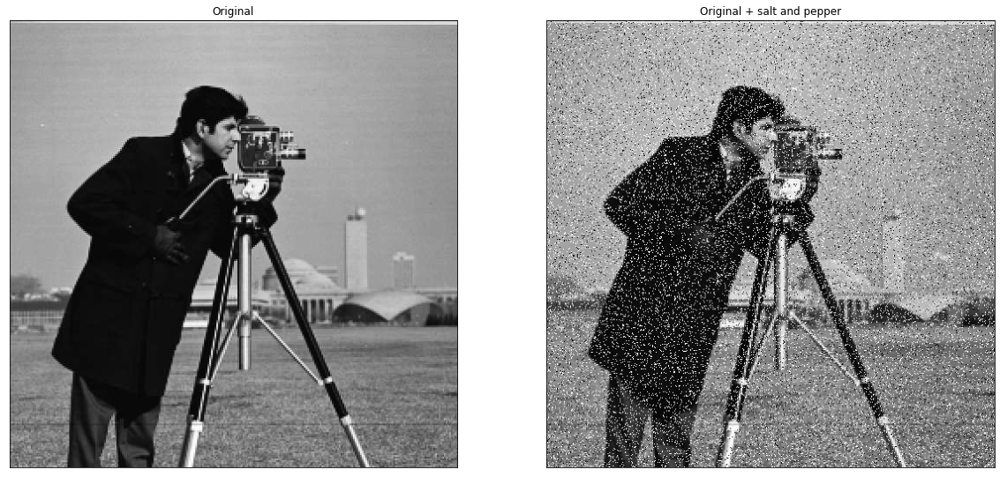

In [511]:
img = CAMERAMAN_IMG
zero_matrix = np.zeros_like(img)
uniform_noise = cv2.randu(zero_matrix,0,255)
plt.imshow(uniform_noise, cmap=cm.gray)

peppered_img = np.where(uniform_noise < 10, 0, img)
salt_pepper_noisy_image = np.where(salt_pepper_noise > 240, 255, peppered_img)

double_plot([img, salt_pepper_noisy_image], titles=['Original', 'Original + salt and pepper'])

#### Median filtering

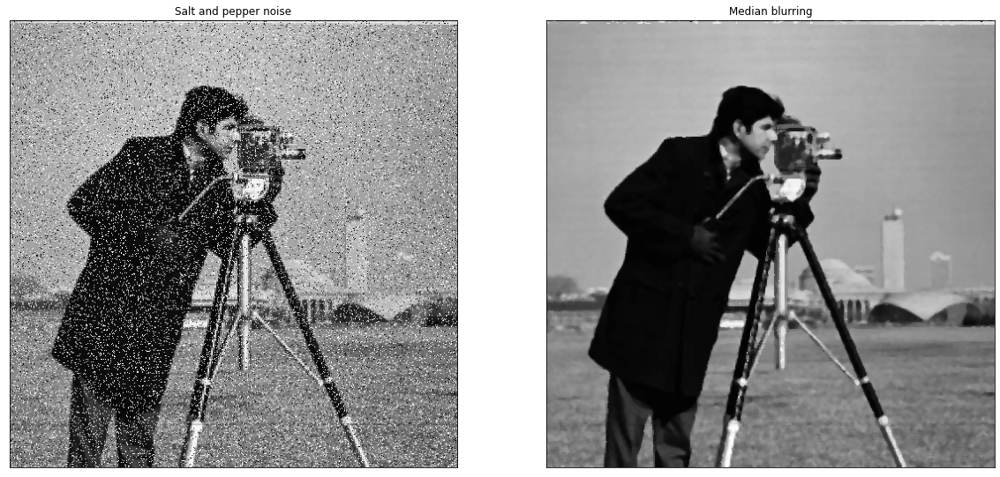

In [514]:
median_filtered = cv2.medianBlur(salt_pepper_noisy_image, kernel)
double_plot([salt_pepper_noisy_image, median_filtered], titles=['Salt and pepper noise', 'Median blurring'])

## 3. Mathematical morphology

#### Non uniform lightning

#### Erosion and dilation

#### Local adaptation

## 4. Segmentation

#### Thresholding and connected components labelling

#### Preprocessing
Closing -> Gaussian filtering -> Thresholding -> Connected components labelling

#### Blob feature

In [109]:
def draw_blob_bounding_boxes(img, conn_comp):
    num_labels = conn_comp[0]
    stats = conn_comp[2]
    
    img_bb = cv2.cvtColor( img, cv2.COLOR_GRAY2RGB)
    for label in range( 1, num_labels):
        topleft = tuple( stats[label,:2])
        bottomright = tuple( stats[label,:2] + stats[label, 2:4])
        cv2.rectangle( img_bb, topleft, bottomright, (255,0,0), 3)
    
    return img_bb


def draw_blob_centroids(img, conn_comp):
    num_labels = conn_comp[0]
    centroids = conn_comp[3]
    
    img_ctr = cv2.cvtColor( img, cv2.COLOR_GRAY2RGB)
    for label in range( 1, num_labels):
        centroid = tuple( centroids[label,:].astype(int))
        cv2.circle( img_ctr, centroid, 3, (255,0,0), thickness=3)
    
    return img_ctr

#### Watershed

#### Find sure background

#### Find sure foreground

#### Find unknown region

#### Sure labelling of image

#### Final segmentation